In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

Displaying Images

In [2]:
bird = cv2.imread('bird.jpg')
cat = cv2.imread('cat.jpg')
landscape = cv2.imread('landscape.jpg')

In [3]:
bird_rgb = cv2.cvtColor(bird, cv2.COLOR_BGR2RGB)
cat_rgb = cv2.cvtColor(cat, cv2.COLOR_BGR2RGB)
landscape_rgb = cv2.cvtColor(landscape, cv2.COLOR_BGR2RGB)

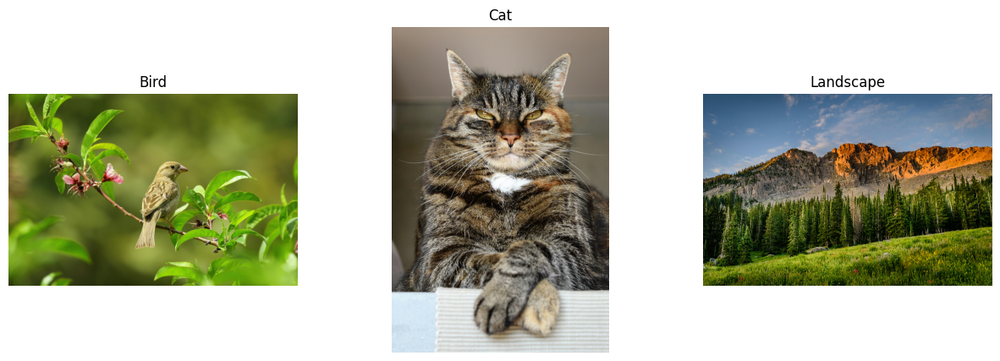

In [4]:
plt.figure(figsize=(15,5))

plt.subplot(1, 3, 1)
plt.imshow(bird_rgb)
plt.title('Bird')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cat_rgb)
plt.title('Cat')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(landscape_rgb)
plt.title('Landscape')
plt.axis('off')

plt.show()

Modifying Brightness

In [6]:
brightness_value = 70
brightness_matrix = np.full(bird.shape, brightness_value, dtype=np.uint8)

brightness_matrix_cat = np.full(cat.shape, brightness_value, dtype=np.uint8)

bird_bright = cv2.add(bird, brightness_matrix)
cat_bright = cv2.add(cat, brightness_matrix_cat)
landscape_bright = cv2.add(landscape, np.full(landscape.shape, brightness_value, dtype=np.uint8))


bird_bright_rgb = cv2.cvtColor(bird_bright, cv2.COLOR_BGR2RGB)
cat_bright_rgb = cv2.cvtColor(cat_bright, cv2.COLOR_BGR2RGB)
landscape_bright_rgb = cv2.cvtColor(landscape_bright, cv2.COLOR_BGR2RGB)

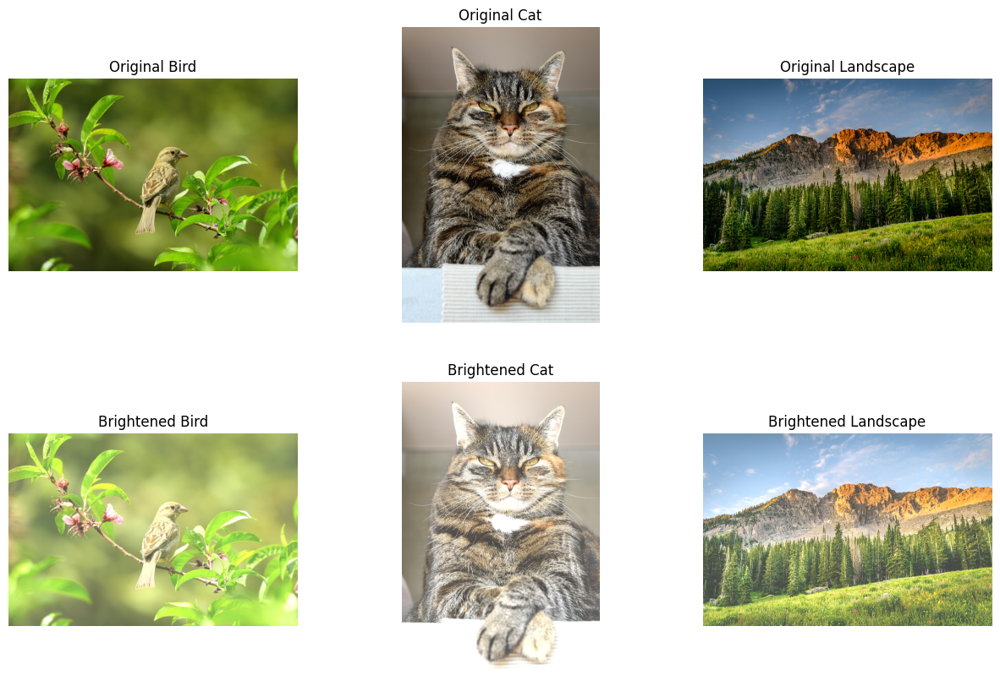

In [7]:
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.imshow(bird_rgb)
plt.title('Original Bird')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cat_rgb)
plt.title('Original Cat')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(landscape_rgb)
plt.title('Original Landscape')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(bird_bright_rgb)
plt.title('Brightened Bird')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cat_bright_rgb)
plt.title('Brightened Cat')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(landscape_bright_rgb)
plt.title('Brightened Landscape')
plt.axis('off')

plt.show()

Modifying Contrast

In [8]:
from google.colab.patches import cv2_imshow

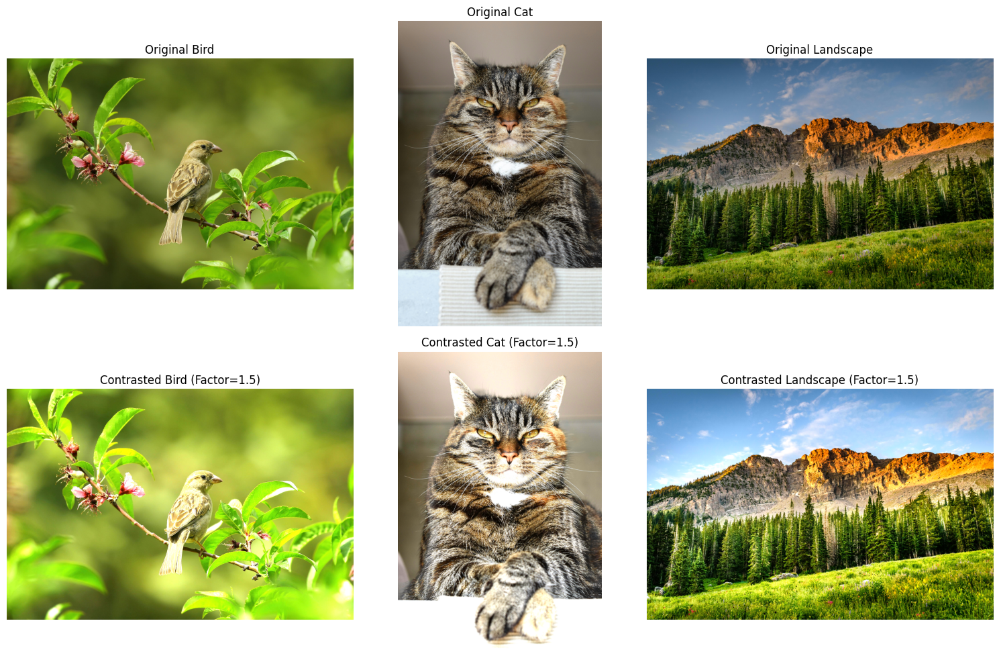

In [9]:
contrast_factor = 1.5
def adjust_contrast(image, factor):
    img_float = image.astype(np.float32)
    img_contrasted = img_float * factor
    img_contrasted = np.clip(img_contrasted, 0, 255).astype(np.uint8)
    return img_contrasted

# Apply contrast adjustment
bird_contrasted = adjust_contrast(bird, contrast_factor)
cat_contrasted = adjust_contrast(cat, contrast_factor)
landscape_contrasted = adjust_contrast(landscape, contrast_factor)

# Convert to RGB for displaying
bird_contrasted_rgb = cv2.cvtColor(bird_contrasted, cv2.COLOR_BGR2RGB)
cat_contrasted_rgb = cv2.cvtColor(cat_contrasted, cv2.COLOR_BGR2RGB)
landscape_contrasted_rgb = cv2.cvtColor(landscape_contrasted, cv2.COLOR_BGR2RGB)

# Display the results
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.imshow(bird_rgb)
plt.title('Original Bird')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cat_rgb)
plt.title('Original Cat')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(landscape_rgb)
plt.title('Original Landscape')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(bird_contrasted_rgb)
plt.title(f'Contrasted Bird (Factor={contrast_factor})')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cat_contrasted_rgb)
plt.title(f'Contrasted Cat (Factor={contrast_factor})')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(landscape_contrasted_rgb)
plt.title(f'Contrasted Landscape (Factor={contrast_factor})')
plt.axis('off')

plt.tight_layout()
plt.show()


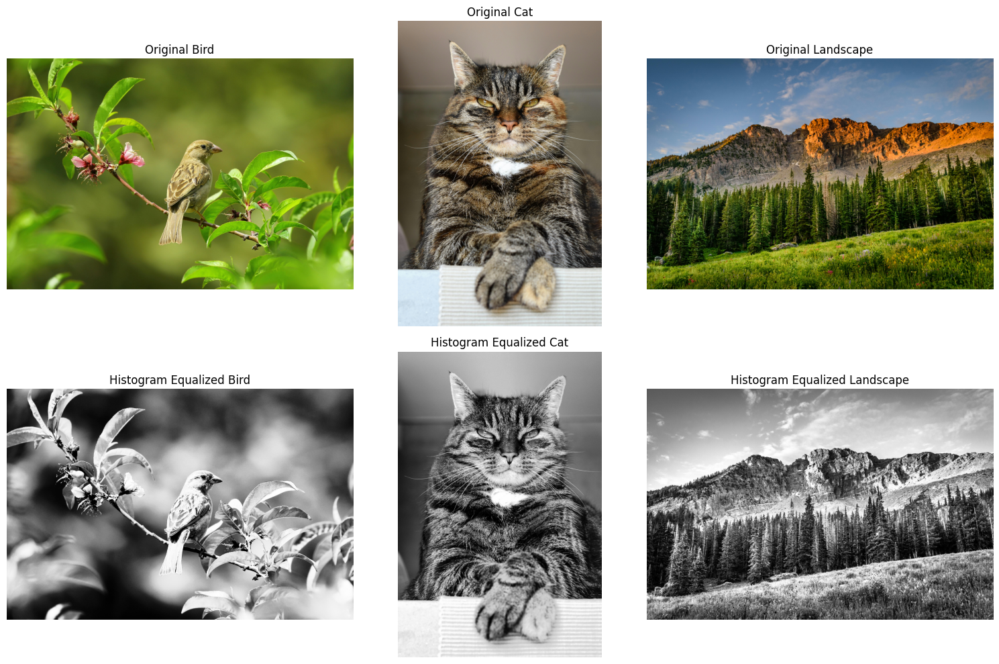

In [10]:
def histogram_equalization(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    equalized = cv2.equalizeHist(gray)
    equalized_bgr = cv2.cvtColor(equalized, cv2.COLOR_GRAY2BGR)
    return equalized_bgr

bird_eq = histogram_equalization(bird)
cat_eq = histogram_equalization(cat)
landscape_eq = histogram_equalization(landscape)

# Convert to RGB for displaying
bird_eq_rgb = cv2.cvtColor(bird_eq, cv2.COLOR_BGR2RGB)
cat_eq_rgb = cv2.cvtColor(cat_eq, cv2.COLOR_BGR2RGB)
landscape_eq_rgb = cv2.cvtColor(landscape_eq, cv2.COLOR_BGR2RGB)

# Display the results
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.imshow(bird_rgb)
plt.title('Original Bird')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cat_rgb)
plt.title('Original Cat')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(landscape_rgb)
plt.title('Original Landscape')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(bird_eq_rgb)
plt.title('Histogram Equalized Bird')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cat_eq_rgb)
plt.title('Histogram Equalized Cat')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(landscape_eq_rgb)
plt.title('Histogram Equalized Landscape')
plt.axis('off')

plt.tight_layout()
plt.show()


Removing Noise (Linear Filter)

In [16]:
def apply_linear_filter(image, kernel_size=(35,35)):
    filtered_image = cv2.blur(image, kernel_size)
    return filtered_image


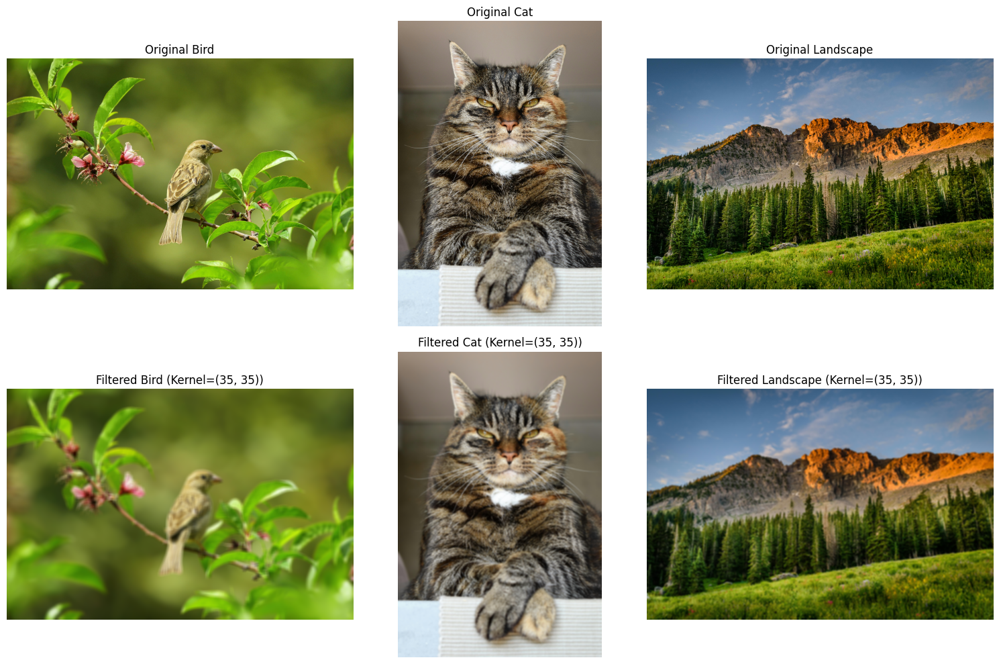

In [17]:
kernel_size = (35, 35)
bird_filtered = apply_linear_filter(bird, kernel_size)
cat_filtered = apply_linear_filter(cat, kernel_size)
landscape_filtered = apply_linear_filter(landscape, kernel_size)
bird_filtered_rgb = cv2.cvtColor(bird_filtered, cv2.COLOR_BGR2RGB)
cat_filtered_rgb = cv2.cvtColor(cat_filtered, cv2.COLOR_BGR2RGB)
landscape_filtered_rgb = cv2.cvtColor(landscape_filtered, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(15, 10))

# Row 1: Original images
plt.subplot(2, 3, 1)
plt.imshow(bird_rgb)
plt.title('Original Bird')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cat_rgb)
plt.title('Original Cat')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(landscape_rgb)
plt.title('Original Landscape')
plt.axis('off')

# Row 2: Filtered images
plt.subplot(2, 3, 4)
plt.imshow(bird_filtered_rgb)
plt.title(f'Filtered Bird (Kernel={kernel_size})')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cat_filtered_rgb)
plt.title(f'Filtered Cat (Kernel={kernel_size})')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(landscape_filtered_rgb)
plt.title(f'Filtered Landscape (Kernel={kernel_size})')
plt.axis('off')

plt.tight_layout()
plt.show()


Removing Noise (Non Linear Filter)

In [20]:
def apply_median_filter(image, ksize=35):
    filtered_image = cv2.medianBlur(image, ksize)
    return filtered_image


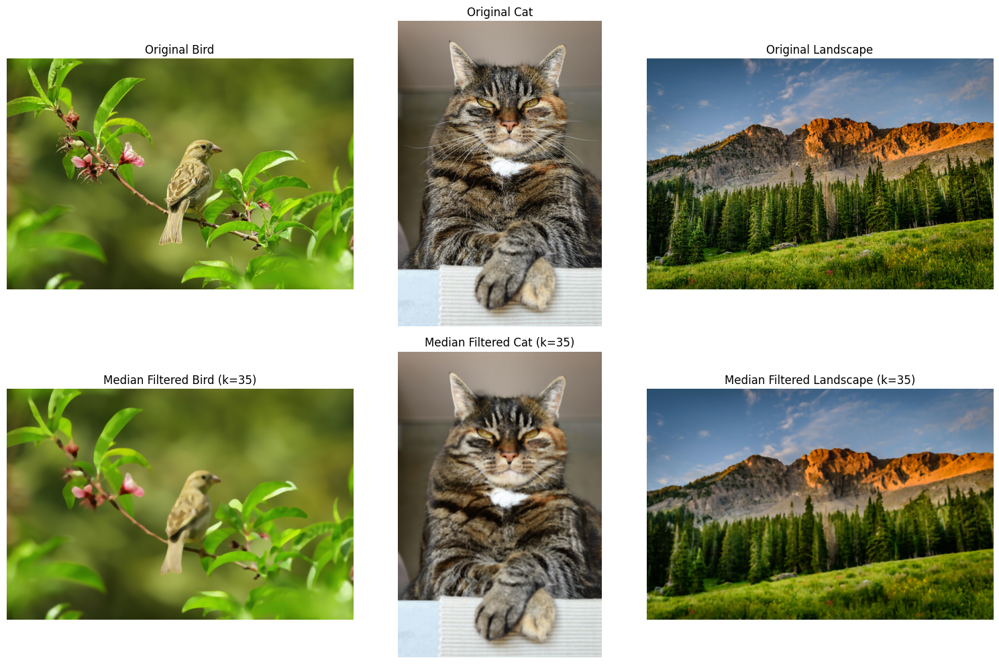

In [21]:
kernel_size = 35
bird_filtered = apply_median_filter(bird, kernel_size)
cat_filtered = apply_median_filter(cat, kernel_size)
landscape_filtered = apply_median_filter(landscape, kernel_size)

bird_filtered_rgb = cv2.cvtColor(bird_filtered, cv2.COLOR_BGR2RGB)
cat_filtered_rgb = cv2.cvtColor(cat_filtered, cv2.COLOR_BGR2RGB)
landscape_filtered_rgb = cv2.cvtColor(landscape_filtered, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(15, 10))

# Row 1: Original images
plt.subplot(2, 3, 1)
plt.imshow(bird_rgb)
plt.title('Original Bird')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cat_rgb)
plt.title('Original Cat')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(landscape_rgb)
plt.title('Original Landscape')
plt.axis('off')

# Row 2: Filtered images
plt.subplot(2, 3, 4)
plt.imshow(bird_filtered_rgb)
plt.title(f'Median Filtered Bird (k={kernel_size})')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cat_filtered_rgb)
plt.title(f'Median Filtered Cat (k={kernel_size})')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(landscape_filtered_rgb)
plt.title(f'Median Filtered Landscape (k={kernel_size})')
plt.axis('off')

plt.tight_layout()
plt.show()

Edge Detection

Sobel

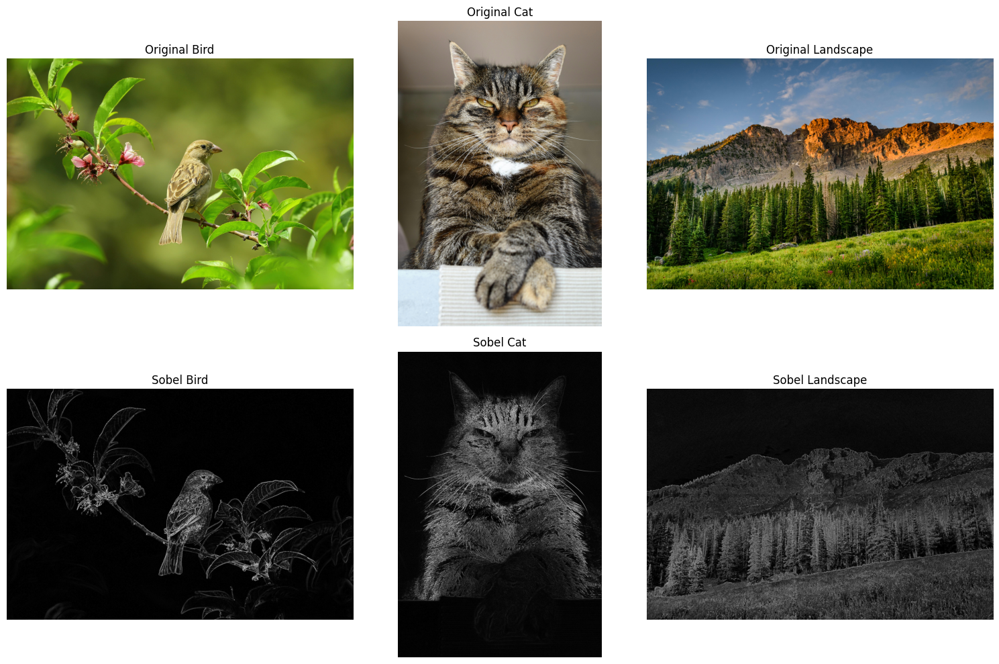

In [22]:
def sobel_edge_detection(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    grad_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    abs_grad_x = cv2.convertScaleAbs(grad_x)
    abs_grad_y = cv2.convertScaleAbs(grad_y)
    sobel = cv2.addWeighted(abs_grad_x, 0.5, abs_grad_y, 0.5, 0)

    return sobel

# Apply Sobel edge detection
bird_sobel = sobel_edge_detection(bird)
cat_sobel = sobel_edge_detection(cat)
landscape_sobel = sobel_edge_detection(landscape)

# Display results alongside the original images
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.imshow(bird_rgb)
plt.title('Original Bird')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cat_rgb)
plt.title('Original Cat')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(landscape_rgb)
plt.title('Original Landscape')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(bird_sobel, cmap='gray')
plt.title('Sobel Bird')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cat_sobel, cmap='gray')
plt.title('Sobel Cat')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(landscape_sobel, cmap='gray')
plt.title('Sobel Landscape')
plt.axis('off')

plt.tight_layout()
plt.show()


Canny

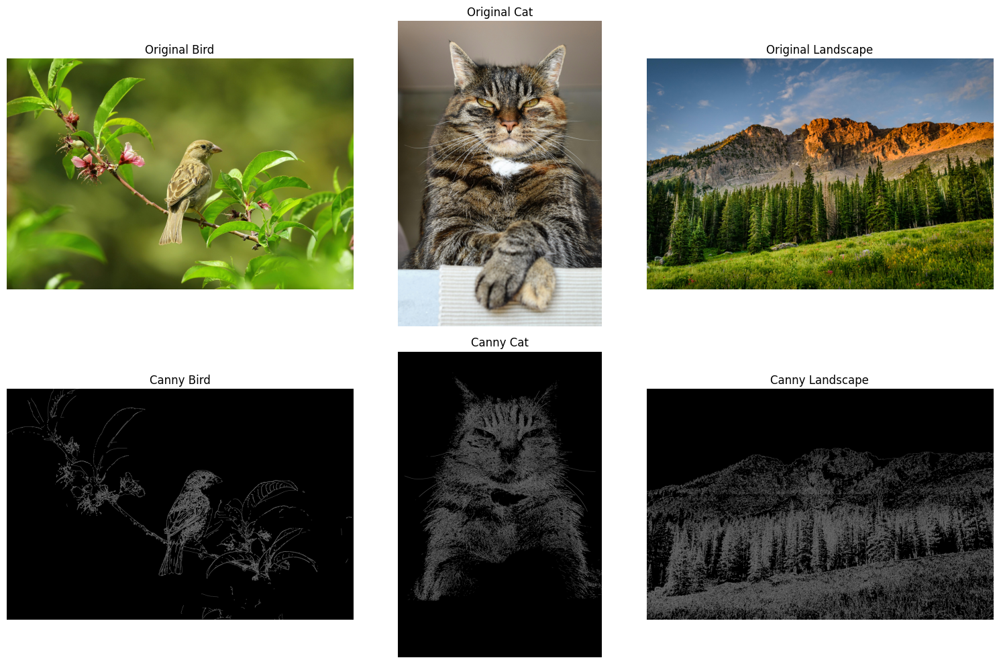

In [23]:
def canny_edge_detection(image, threshold1=100, threshold2=200):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, threshold1, threshold2)
    return edges

# Apply Canny edge detection
bird_canny = canny_edge_detection(bird, 100, 200)
cat_canny = canny_edge_detection(cat, 100, 200)
landscape_canny = canny_edge_detection(landscape, 100, 200)

# Display results alongside the original images
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.imshow(bird_rgb)
plt.title('Original Bird')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cat_rgb)
plt.title('Original Cat')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(landscape_rgb)
plt.title('Original Landscape')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(bird_canny, cmap='gray')
plt.title('Canny Bird')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cat_canny, cmap='gray')
plt.title('Canny Cat')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(landscape_canny, cmap='gray')
plt.title('Canny Landscape')
plt.axis('off')

plt.tight_layout()
plt.show()


Log

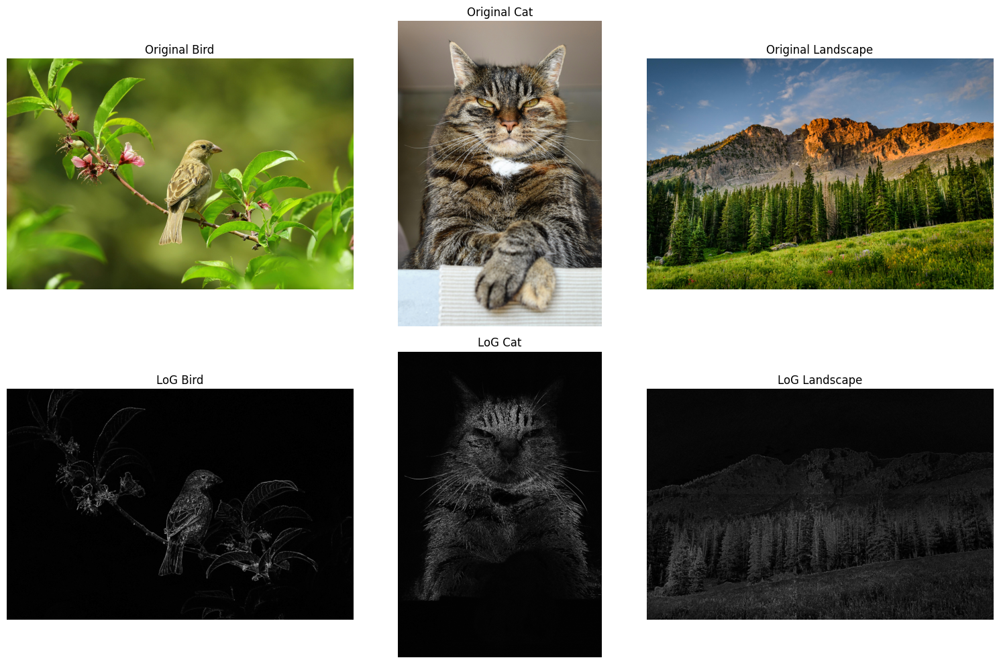

In [24]:
def log_edge_detection(image, ksize=3):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (3, 3), 0)
    lap = cv2.Laplacian(blurred, cv2.CV_64F, ksize=ksize)
    lap_abs = cv2.convertScaleAbs(lap)
    return lap_abs

# Apply LoG edge detection
bird_log = log_edge_detection(bird, ksize=3)
cat_log = log_edge_detection(cat, ksize=3)
landscape_log = log_edge_detection(landscape, ksize=3)

# Display results alongside the original images
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.imshow(bird_rgb)
plt.title('Original Bird')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(cat_rgb)
plt.title('Original Cat')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(landscape_rgb)
plt.title('Original Landscape')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(bird_log, cmap='gray')
plt.title('LoG Bird')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(cat_log, cmap='gray')
plt.title('LoG Cat')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(landscape_log, cmap='gray')
plt.title('LoG Landscape')
plt.axis('off')

plt.tight_layout()
plt.show()


Comparison

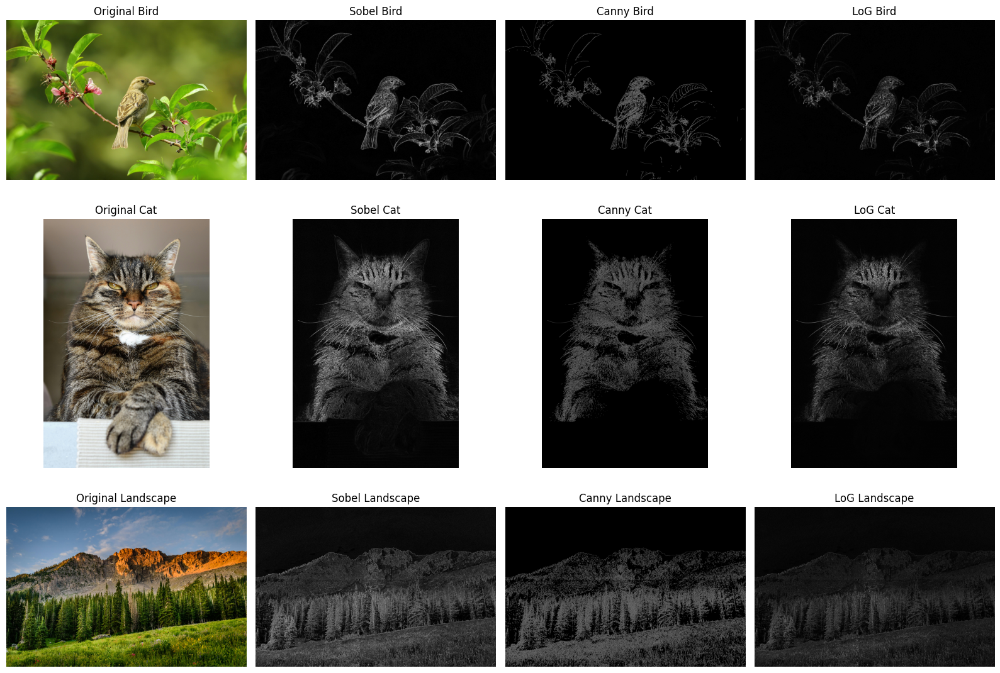

In [25]:
plt.figure(figsize=(16, 12))

plt.subplot(3, 4, 1)
plt.imshow(bird_rgb)
plt.title('Original Bird')
plt.axis('off')

plt.subplot(3, 4, 2)
plt.imshow(bird_sobel, cmap='gray')
plt.title('Sobel Bird')
plt.axis('off')

plt.subplot(3, 4, 3)
plt.imshow(bird_canny, cmap='gray')
plt.title('Canny Bird')
plt.axis('off')

plt.subplot(3, 4, 4)
plt.imshow(bird_log, cmap='gray')
plt.title('LoG Bird')
plt.axis('off')

plt.subplot(3, 4, 5)
plt.imshow(cat_rgb)
plt.title('Original Cat')
plt.axis('off')

plt.subplot(3, 4, 6)
plt.imshow(cat_sobel, cmap='gray')
plt.title('Sobel Cat')
plt.axis('off')

plt.subplot(3, 4, 7)
plt.imshow(cat_canny, cmap='gray')
plt.title('Canny Cat')
plt.axis('off')

plt.subplot(3, 4, 8)
plt.imshow(cat_log, cmap='gray')
plt.title('LoG Cat')
plt.axis('off')

plt.subplot(3, 4, 9)
plt.imshow(landscape_rgb)
plt.title('Original Landscape')
plt.axis('off')

plt.subplot(3, 4, 10)
plt.imshow(landscape_sobel, cmap='gray')
plt.title('Sobel Landscape')
plt.axis('off')

plt.subplot(3, 4, 11)
plt.imshow(landscape_canny, cmap='gray')
plt.title('Canny Landscape')
plt.axis('off')

plt.subplot(3, 4, 12)
plt.imshow(landscape_log, cmap='gray')
plt.title('LoG Landscape')
plt.axis('off')

plt.tight_layout()
plt.show()
